# Semantic Segmentation with Deep Learning: Training and Testing on Colab

Insert the following Javascript snippet into your browser console so that your Colab runtime won't time out. Open developer-settings (in your web-browser) with Ctrl+Shift+I then click on console tab and type this on the console prompt. (for mac press Option+Command+I)
```Javascript
function ClickConnect(){
    console.log("Clicked on connect button"); 
    document.querySelector("colab-connect-button").click()
}
setInterval(ClickConnect,60000)
```

Zip up your code locally with `python zip_for_colab.py`, and upload your `cv_proj5.zip` file. Hit refresh, then run the following:

In [1]:
!unzip -o cv_proj5_colab.zip


Archive:  cv_proj5_colab.zip
  inflating: pyproject.toml          
  inflating: download_dataset.sh     
  inflating: setup.cfg               
  inflating: Camvid/camvid_semseg11.zip  
  inflating: Camvid/semseg11/0016E5_08085_L.png  
  inflating: Camvid/semseg11/0006R0_f01080_L.png  
  inflating: Camvid/semseg11/0016E5_00480_L.png  
  inflating: Camvid/semseg11/0016E5_01350_L.png  
  inflating: Camvid/semseg11/0016E5_01560_L.png  
  inflating: Camvid/semseg11/0016E5_01440_L.png  
  inflating: Camvid/semseg11/0016E5_06150_L.png  
  inflating: Camvid/semseg11/0016E5_08045_L.png  
  inflating: Camvid/semseg11/0016E5_00390_L.png  
  inflating: Camvid/semseg11/0016E5_07680_L.png  
  inflating: Camvid/semseg11/0016E5_08139_L.png  
  inflating: Camvid/semseg11/0016E5_08280_L.png  
  inflating: Camvid/semseg11/0016E5_01110_L.png  
  inflating: Camvid/semseg11/0016E5_08550_L.png  
  inflating: Camvid/semseg11/0006R0_f02850_L.png  
  inflating: Camvid/semseg11/0016E5_05940_L.png  
  inflating: 

Install the `proj6_code` module locally:

In [2]:
!ls

Camvid                exp                   src
README.md             initmodel             temp_submission
conda                 kitti                 tests
cv_proj5_colab.zip    proj5_colab.ipynb     venv
dataset_lists         proj5_local.ipynb     vision
doc                   pyproject.toml        zip_for_colab.py
download_dataset.sh   resnet50_v2.pth       zip_submission.py
download_dataset.sh-e setup.cfg


Download ImageNet-pretrained ResNet-50:


In [3]:
!wget -O "resnet50_v2.pth" --no-check-certificate 'https://docs.google.com/uc?export=download&id=1w5pRmLJXvmQQA5PtCbHhZc_uC4o0YbmA'
!mkdir initmodel && mv resnet50_v2.pth initmodel/

--2023-12-01 21:21:10--  https://docs.google.com/uc?export=download&id=1w5pRmLJXvmQQA5PtCbHhZc_uC4o0YbmA
Resolving docs.google.com (docs.google.com)... 142.250.196.110
Connecting to docs.google.com (docs.google.com)|142.250.196.110|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-c8-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/5l956pt10prt9lauigrk0itm58d3mmg7/1701433275000/15543419006824780045/*/1w5pRmLJXvmQQA5PtCbHhZc_uC4o0YbmA?e=download&uuid=466f8ba1-58da-490a-ac1f-d8e0fcb8061c [following]
--2023-12-01 21:21:17--  https://doc-14-c8-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/5l956pt10prt9lauigrk0itm58d3mmg7/1701433275000/15543419006824780045/*/1w5pRmLJXvmQQA5PtCbHhZc_uC4o0YbmA?e=download&uuid=466f8ba1-58da-490a-ac1f-d8e0fcb8061c
Resolving doc-14-c8-docs.googleusercontent.com (doc-14-c8-docs.googleusercontent.com)... 142.250.206.193
Connecting to doc-14-c8-docs.googleuserconten

In [16]:
# The ImageNet-pretrained ResNet-50 weights should be 99 MB
!ls -ltrh initmodel

total 201128
-rw-r--r--  1 sangjunerhee  staff    98M Dec  1 17:54 resnet50_v2.pth


Download the Camvid dataset images. It's 700 MB, but it should only take 30 sec.

In [8]:
!chmod +rwx download_dataset.sh
!sed -i -e 's/\r$//' download_dataset.sh
!./download_dataset.sh Camvid

chmod: +rwx: No such file or directory
sed: illegal option -- o
usage: sed script [-Ealnru] [-i extension] [file ...]
	sed [-Ealnu] [-i extension] [-e script] ... [-f script_file] ... [file ...]
zsh:1: permission denied: ./download_dataset.sh


In [17]:
!ls
!cd Camvid && unzip -o camvid_semseg11.zip && cd ..

Camvid                exp                   src
README.md             initmodel             temp_submission
conda                 kitti                 tests
cv_proj5_colab.zip    proj5_colab.ipynb     venv
dataset_lists         proj5_local.ipynb     vision
doc                   pyproject.toml        zip_for_colab.py
download_dataset.sh   resnet50_v2.pth       zip_submission.py
download_dataset.sh-e setup.cfg


Archive:  camvid_semseg11.zip
  inflating: semseg11/0016E5_08085_L.png  
  inflating: semseg11/0006R0_f01080_L.png  
  inflating: semseg11/0016E5_00480_L.png  
  inflating: semseg11/0016E5_01350_L.png  
  inflating: semseg11/0016E5_01560_L.png  
  inflating: semseg11/0016E5_01440_L.png  
  inflating: semseg11/0016E5_06150_L.png  
  inflating: semseg11/0016E5_08045_L.png  
  inflating: semseg11/0016E5_00390_L.png  
  inflating: semseg11/0016E5_07680_L.png  
  inflating: semseg11/0016E5_08139_L.png  
  inflating: semseg11/0016E5_08280_L.png  
  inflating: semseg11/0016E5_01110_L.png  
 extracting: semseg11/0016E5_08550_L.png  
  inflating: semseg11/0006R0_f02850_L.png  
  inflating: semseg11/0016E5_05940_L.png  
  inflating: semseg11/0016E5_07230_L.png  
  inflating: semseg11/0016E5_00720_L.png  
  inflating: semseg11/0006R0_f01320_L.png  
  inflating: semseg11/0016E5_08061_L.png  
  inflating: semseg11/0016E5_08019_L.png  
  inflating: semseg11/0016E5_04980_L.png  
  inflating: semseg11

We'll now set some default hyperparameters for training. Choose the number of epochs you'd like to train for (for PSPNet, it will take ~30 min for 50 epochs, or ~70 min for 100 epochs).

In [2]:
!python --version
from types import SimpleNamespace

args = SimpleNamespace(
    **{
        # DATA
        "names_path": "./dataset_lists/camvid-11/camvid-11_names.txt",
        "data_root": "./Camvid/",
        "train_list": "./src/dataset_lists/camvid-11/list/train.txt",  
        "val_list": "./src/dataset_lists/camvid-11/list/val.txt",
        "classes": 11,
        # TRAIN
        "arch": "PSPNet", #  "SimpleSegmentationNet", # 
        "save_path": "",
        "epochs": 5,
        "zoom_factor": 8,
        "use_ppm": True,
        "aux_weight": 0.4,
        "aux_loss": True,
        "layers": 50,
        "workers": 2,
        "batch_size": 32,
        "batch_size_val": 32,
        "data_aug": True,
        "short_size": 240,
        "train_h": 201,
        "train_w": 201,
        "init_weight": "./initmodel/resnet50_v2.pth",
        "scale_min": 0.5,  # minimum random scale
        "scale_max": 2.0,  # maximum random scale
        "rotate_min": -10,  # minimum random rotate
        "rotate_max": 10,  # maximum random rotate
        "ignore_label": 255,
        "base_lr": 0.01,
        "start_epoch": 0,
        "power": 0.9,
        "momentum": 0.9,
        "weight_decay": 0.0001,
        "manual_seed": 0,
        "print_freq": 10,
        "save_freq": 1,
        "evaluate": True,  # evaluate on validation set, extra gpu memory needed and small batch_size_val is recommend
        "multiprocessing_distributed": False,
        # INFERENCE
        "dataset": "camvid-11",
        "base_size": 240,
        "test_h": 201,
        "test_w": 201,
        "scales": [1.0], # [0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        "test_list": "./src/dataset_lists/camvid-11/list/val.txt",
        "vis_freq": 10,
        "pretrained": True
    }
)

args.save_path = f"exp/camvid/{args.arch}/model"

Python 3.11.6


In [3]:
import os

import torch

os.makedirs(args.save_path, exist_ok=True)
from src.vision.trainer import main_worker
print(args)
main_worker(args, torch.cuda.is_available())

namespace(names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./Camvid/', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=11, arch='PSPNet', save_path='exp/camvid/PSPNet/model', epochs=5, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=True, layers=50, workers=2, batch_size=32, batch_size_val=32, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.01, start_epoch=0, power=0.9, momentum=0.9, weight_decay=0.0001, manual_seed=0, print_freq=10, save_freq=1, evaluate=True, multiprocessing_distributed=False, dataset='camvid-11', base_size=240, test_h=201, test_w=201, scales=[1.0], test_list='./src/dataset_lists/camvid-11/list/val.txt', vis_freq=10, pretrained=True)
[2023-12-01 21:27:58,436 INFO trainer.py line 59 38412] namespace(names_path='./dataset_lists/ca

We'll now create full-resolution predictions for the full val set, and compute mIoU against the ground truth.

In [4]:
from src.vision.test import test_model
args.model_path = f"exp/camvid/{args.arch}/model/train_epoch_{args.epochs}.pth"
test_model(args)

[2023-12-01 21:39:45,093 INFO test.py line 280 38412] => loading checkpoint 'exp/camvid/PSPNet/model/train_epoch_5.pth'
[2023-12-01 21:39:45,413 INFO test.py line 286 38412] => loaded checkpoint 'exp/camvid/PSPNet/model/train_epoch_5.pth'
[2023-12-01 21:39:45,453 INFO test.py line 298 38412] >>>>>>>>>>>>>> Start inference task >>>>>>>>>>>>>
List of (image,label) pairs test list generated!
[2023-12-01 21:39:51,651 INFO test.py line 405 38412] On image 0
[2023-12-01 21:39:52,949 INFO test.py line 405 38412] On image 1
[2023-12-01 21:39:54,005 INFO test.py line 405 38412] On image 2
[2023-12-01 21:39:55,144 INFO test.py line 405 38412] On image 3
[2023-12-01 21:39:56,347 INFO test.py line 405 38412] On image 4
[2023-12-01 21:39:57,212 INFO test.py line 405 38412] On image 5
[2023-12-01 21:39:58,002 INFO test.py line 405 38412] On image 6
[2023-12-01 21:39:58,765 INFO test.py line 405 38412] On image 7
[2023-12-01 21:39:59,789 INFO test.py line 405 38412] On image 8
[2023-12-01 21:40:00,74

**Important**: Record the mIoU listed in the output above, and the IoU per each class. You can find the results later in `train_epoch_{args.epochs}/camvid-11/720/results.txt`.

Now, let's take a look at what our results look like. We'll make a 2x3 image grid with the following structure:

|RGB Image | Blended RGB and Ground Truth | Ground Truth 
|:-: | :-: | :-:
| RGB Image | Blended RGB and Prediction | Prediction

/var/folders/94/lctfrv6d0bl2_1z3ktldspv00000gn/T/ipykernel_38412/2526920291.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')


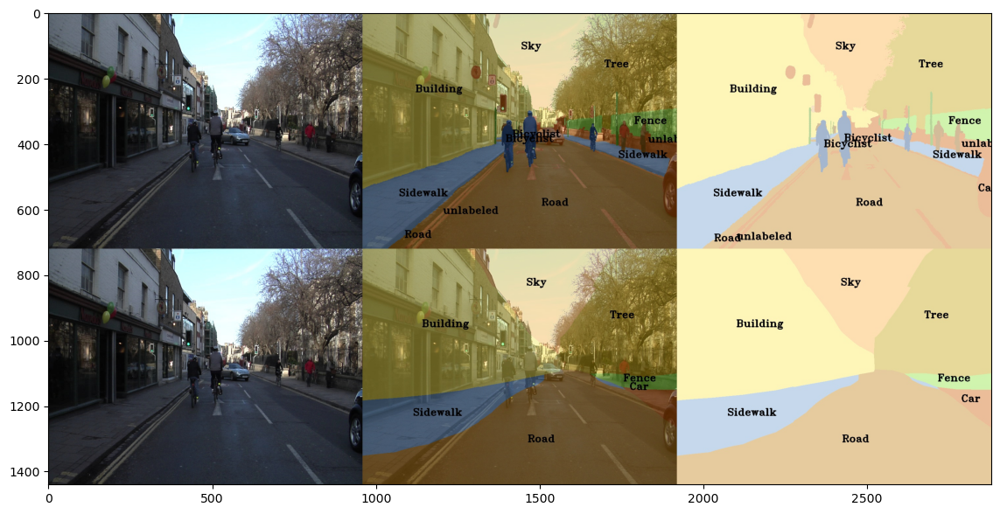

In [5]:
import imageio
import matplotlib.pyplot as plt

rgb_predictions_dir = f"train_epoch_{args.epochs}/camvid-11/{args.base_size}/rgb_mask_predictions"

def show_image_grid(rgb_predictions_dir: str, img_fname: str) -> None:
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')
  plt.figure(figsize=(15,7))
  plt.imshow(img_grid)
  plt.show()

show_image_grid(rgb_predictions_dir, "0016E5_07977.jpg")

We'll look at more examples:

/var/folders/94/lctfrv6d0bl2_1z3ktldspv00000gn/T/ipykernel_38412/2526920291.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')


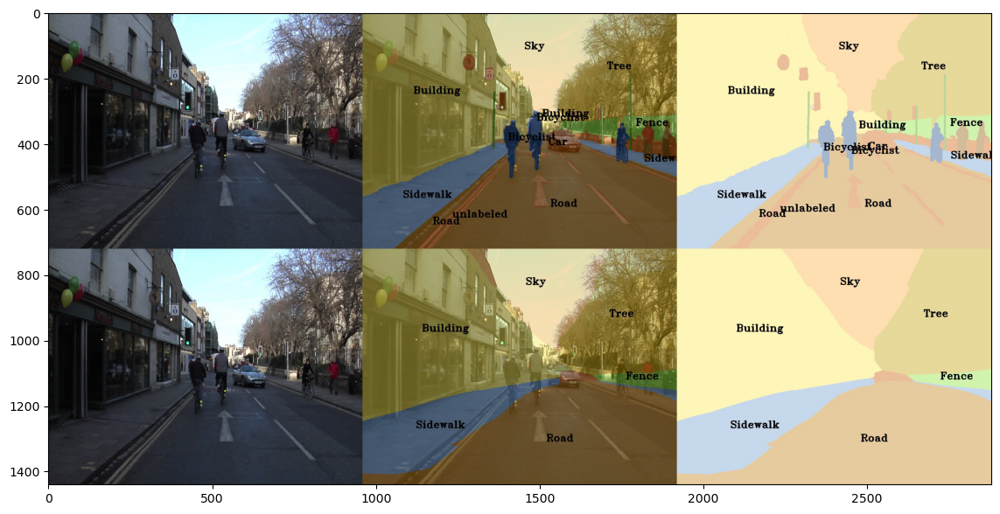

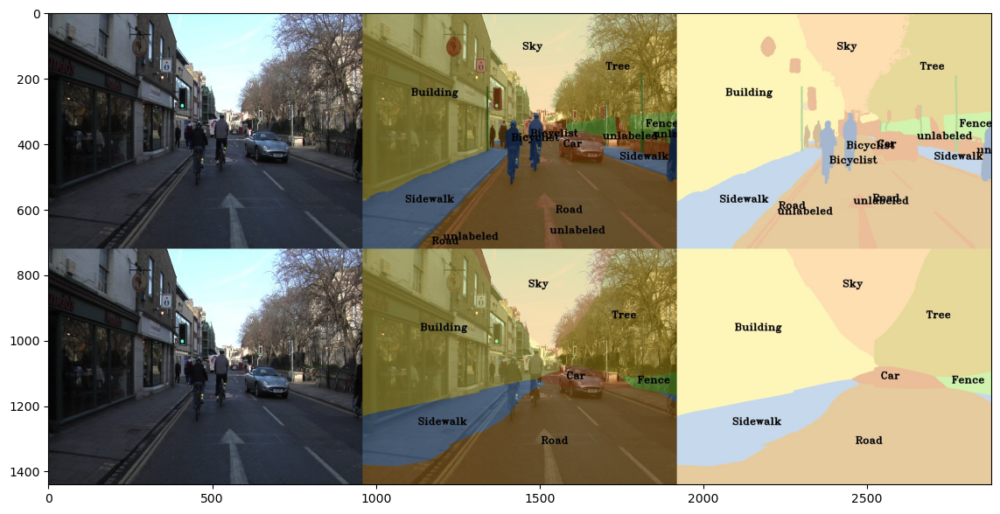

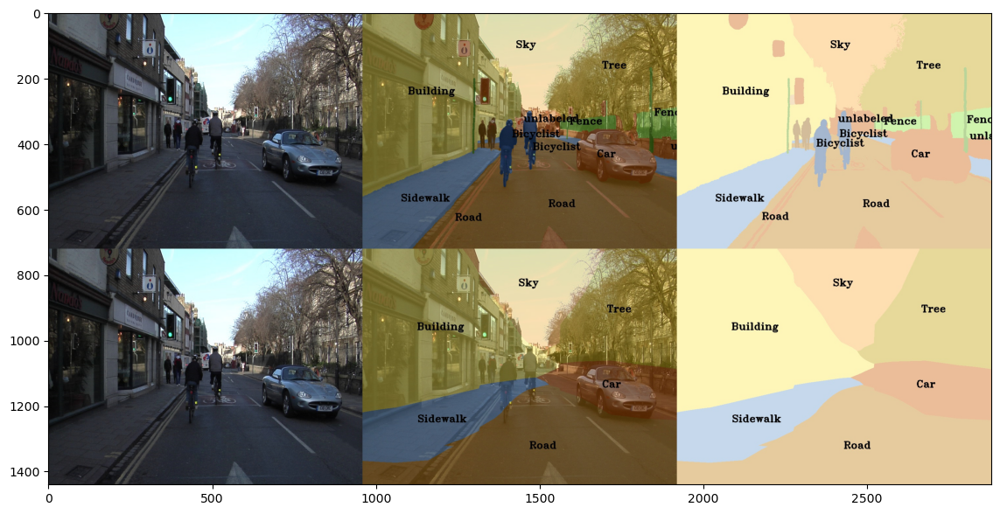

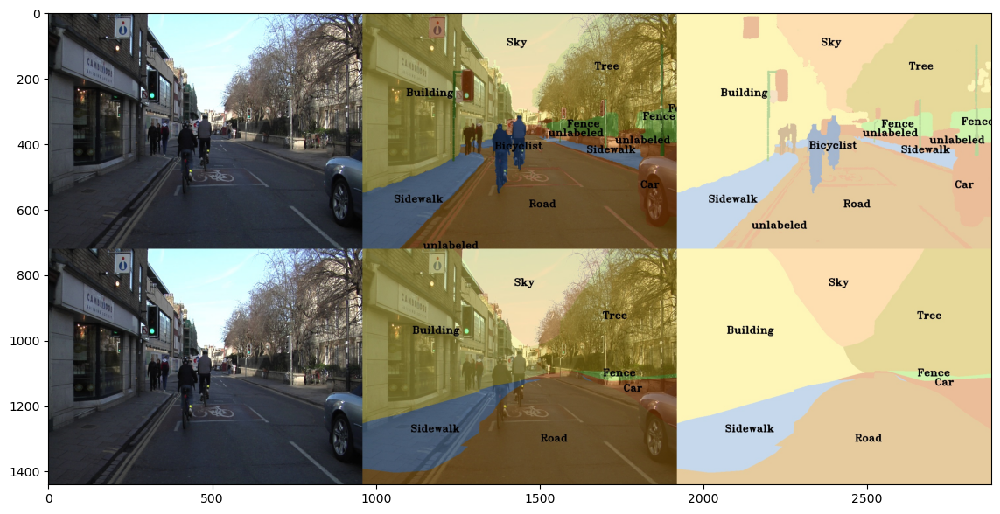

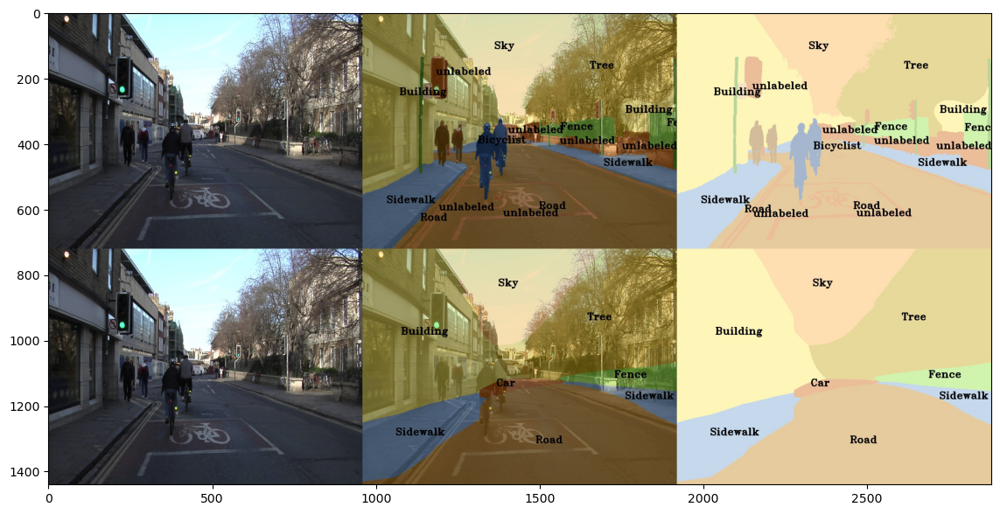

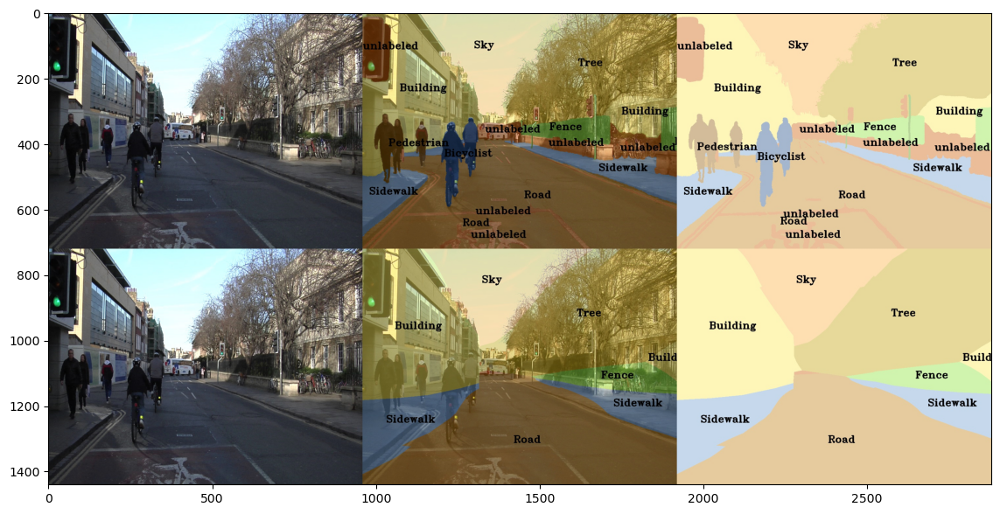

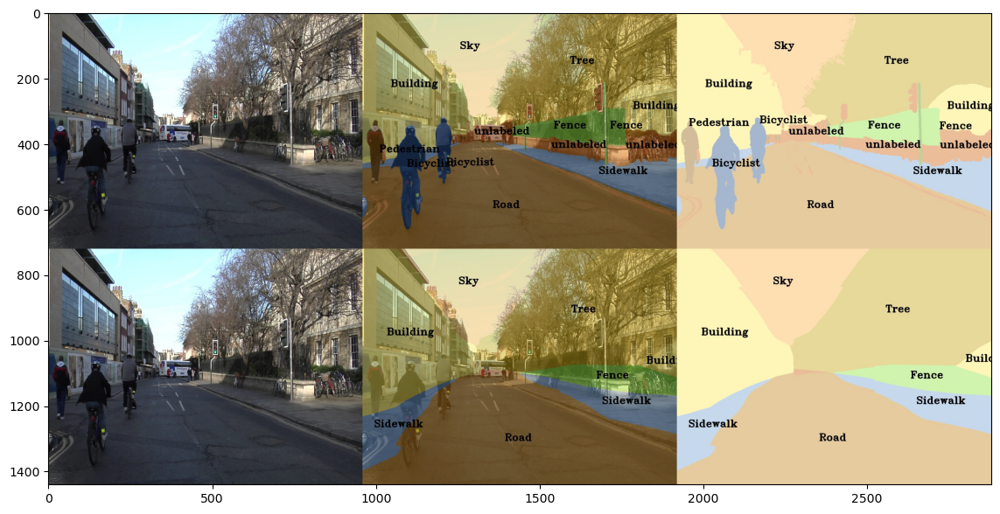

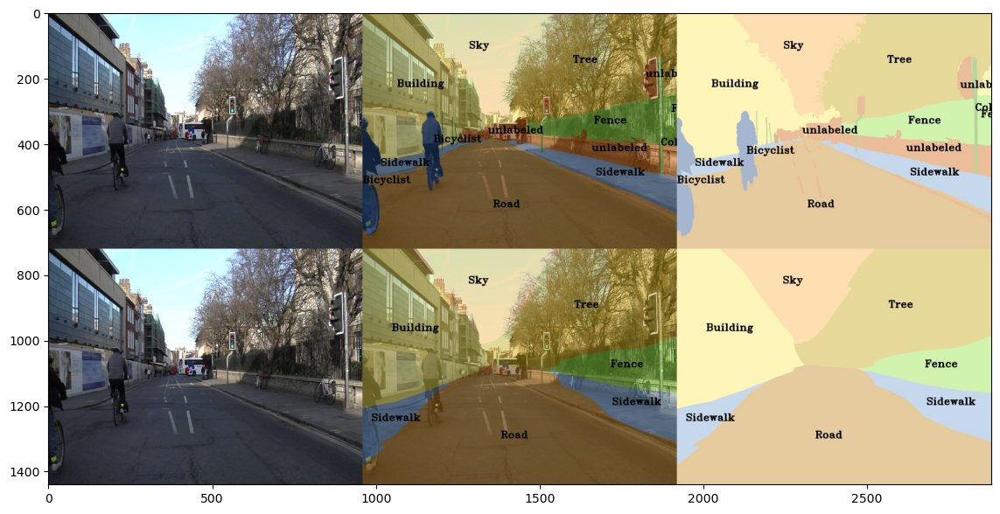

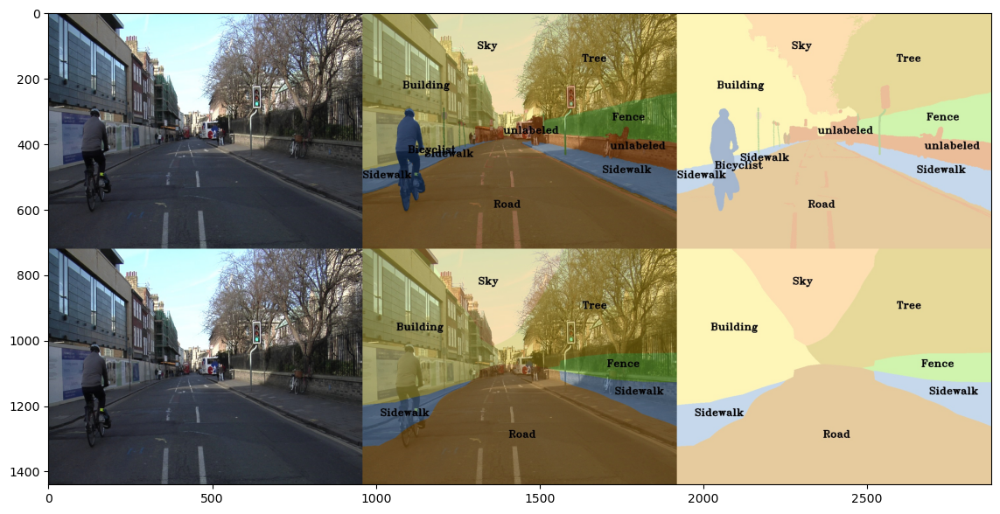

In [6]:
show_image_grid(rgb_predictions_dir, "0016E5_07997.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08017.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08037.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08057.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08077.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08097.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08117.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08137.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08157.jpg")

Now, zip up your predictions on the test set for your best model, **download them locally to your machine**, and submit these to Gradescope:

In [7]:
grayscale_predictions_dir = f"train_epoch_{args.epochs}/camvid-11/{args.base_size}/gray"
!ls -ltrh $grayscale_predictions_dir
!zip -r grayscale_predictions.zip $grayscale_predictions_dir
!ls -ltrh grayscale_predictions.zip

total 1616
-rw-r--r--  1 sangjunerhee  staff   5.1K Dec  1 21:39 0016E5_07959.png
-rw-r--r--  1 sangjunerhee  staff   5.1K Dec  1 21:39 0016E5_07961.png
-rw-r--r--  1 sangjunerhee  staff   5.2K Dec  1 21:39 0016E5_07963.png
-rw-r--r--  1 sangjunerhee  staff   5.1K Dec  1 21:39 0016E5_07965.png
-rw-r--r--  1 sangjunerhee  staff   5.2K Dec  1 21:39 0016E5_07967.png
-rw-r--r--  1 sangjunerhee  staff   5.3K Dec  1 21:39 0016E5_07969.png
-rw-r--r--  1 sangjunerhee  staff   5.3K Dec  1 21:39 0016E5_07971.png
-rw-r--r--  1 sangjunerhee  staff   5.2K Dec  1 21:39 0016E5_07973.png
-rw-r--r--  1 sangjunerhee  staff   5.1K Dec  1 21:40 0016E5_07975.png
-rw-r--r--  1 sangjunerhee  staff   5.2K Dec  1 21:40 0016E5_07977.png
-rw-r--r--  1 sangjunerhee  staff   5.1K Dec  1 21:40 0016E5_07979.png
-rw-r--r--  1 sangjunerhee  staff   5.2K Dec  1 21:40 0016E5_07981.png
-rw-r--r--  1 sangjunerhee  staff   5.2K Dec  1 21:40 0016E5_07983.png
-rw-r--r--  1 sangjunerhee  staff   5.2K Dec  1 21:40 0016E5_07985

In this section you will load the model trained on the Camvid-11 dataset and train it on the Kitti Road Segmentation dataset.

In [8]:
args.model_path = f"exp/camvid/{args.arch}/model/train_epoch_{args.epochs}.pth"
args.data_root = "./kitti"
args.classes = 2
args.save_path = f"exp/kitti/{args.arch}/model"
args.batch_size = 32
args.batch_size_val = 1
args.dataset = "kitti"
args.evaluate = False
args.epochs = 20

import os

import torch
os.makedirs(args.save_path, exist_ok=True)
print(args)

namespace(names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./kitti', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=2, arch='PSPNet', save_path='exp/kitti/PSPNet/model', epochs=20, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=True, layers=50, workers=2, batch_size=32, batch_size_val=1, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.01, start_epoch=0, power=0.9, momentum=0.9, weight_decay=0.0001, manual_seed=0, print_freq=10, save_freq=1, evaluate=False, multiprocessing_distributed=False, dataset='kitti', base_size=240, test_h=201, test_w=201, scales=[1.0], test_list='./src/dataset_lists/camvid-11/list/val.txt', vis_freq=10, pretrained=True, model_path='exp/camvid/PSPNet/model/train_epoch_5.pth', split='test', save_folder='train_epoch_5/camvid

In [9]:
args.base_lr = 0.01
args.momentum = 0.9
args.weight_decay = 0.0001

In [10]:
from src.vision.trainer import transfer_train
transfer_train(args, torch.cuda.is_available())

[2023-12-01 21:42:16,932 INFO part6_transfer_learning.py line 53 38412] => loading checkpoint 'exp/camvid/PSPNet/model/train_epoch_5.pth'
[2023-12-01 21:42:17,282 INFO part6_transfer_learning.py line 59 38412] => loaded checkpoint 'exp/camvid/PSPNet/model/train_epoch_5.pth'
[2023-12-01 21:42:17,787 INFO trainer.py line 164 38412] namespace(names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./kitti', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=2, arch='PSPNet', save_path='exp/kitti/PSPNet/model', epochs=20, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=True, layers=50, workers=2, batch_size=32, batch_size_val=1, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.01, start_epoch=0, power=0.9, momentum=0.9, weight_decay=0.0001, manual_seed=0, print_

## Don't forget to download the grayscale_predictions.zip and exp folder!